# Visualizing neural network models with visual_keras

This notebook provides examples of how to use the _visual__keras_ library to visualize neural network models.
VGG16 and Inception V3 are used as running example, althoguh the library can be applied to any other valid Keras model

Some techniques are specific to CNNs and conv layers. Such cases are spelled out explicitely.

The following visualization techniques are demonstrated:

* [Visualization of conv filters](#filters)
* [Visualization of conv and pooling activations](#activations)
* [Nearest neighbors in feature space](#knn)
* [Class image generation](#maximize)
* Vanilla saliency maps
* Smooth Grad saliency maps
* Integrated Gradients saliency maps
* Grad-CAM saliency maps

Let's start by importing the required modules and loading the VGG16 model pre-trained on Imagenet:

In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as image
from keras.applications.vgg16 import VGG16, preprocess_input
from visual_keras import utils, visualization, saliency, activation_maximization
from keras import backend as K

Using TensorFlow backend.


In [2]:
cfg = K.tf.ConfigProto()
cfg.gpu_options.allow_growth = True
K.set_session(K.tf.Session(config=cfg))

In [3]:
vgg = VGG16(include_top=True, weights="imagenet")
vgg.summary()

Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
bloc

<a id='filters'></a>
## Visualize conv filter

Visualizes the weights of convolutional filter. The technique is useful to understand regularities captured in the first conv layer of a network, such as edges, color patterns. However the techniques it is less relevant for later layers, as regularities become more complex and less interpretable.

Filters of the first conv layer are each visalized as 3-channel rgb images. Filters from other layers are each visualized by _n_ grayscale images, where _n_ is the number of input channels to the layer.


/home/marco/dev/dlviz/visual-keras/visual_keras/visualization.py:53: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


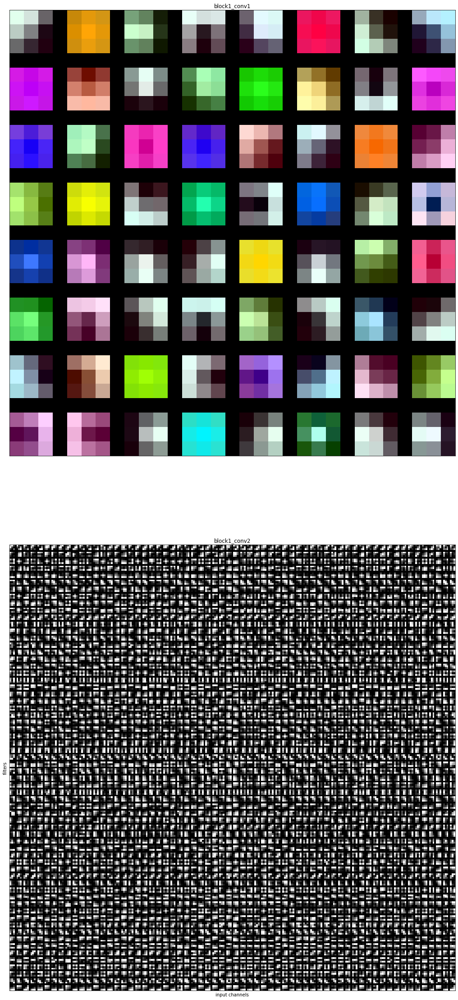

In [5]:
visualization.viz_conv_filters(vgg, ["block1_conv1", "block1_conv2"])

<a id='activations'></a>
## Visualize conv and pool activations
Visualizes the output of conv and pooling layers given an input image, showing how the image information is captured and decomposed in different filters. Each layer is formed by a number of 2D filters. The activation of each filter is shown as a separate image.
Note that the target image is preprocessed by applying the same transformations used for the training images, thus ensuring proper results. This is done by passing the VGG16 preprocessing function as argument for `f_preproc`:

/home/marco/dev/dlviz/visual-keras/visual_keras/visualization.py:90: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


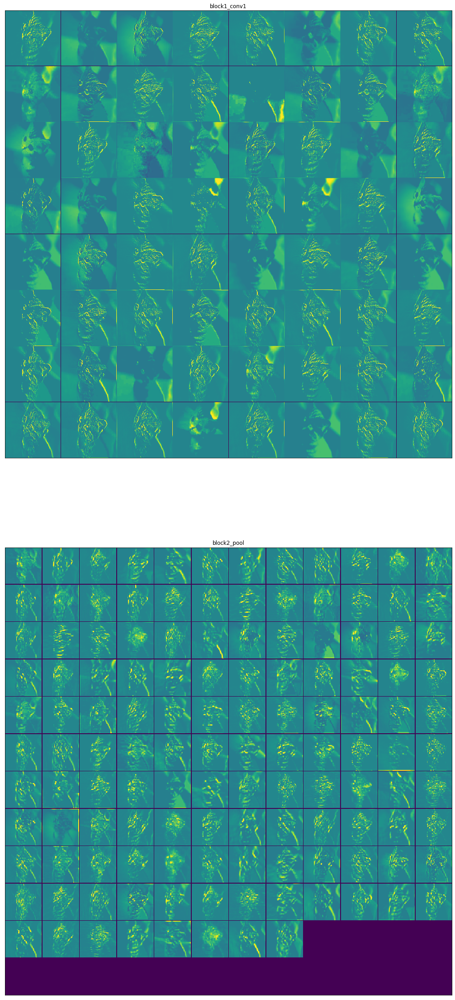

In [6]:
visualization.viz_activations("./images/kitten.jpg",
                vgg,
                ["block1_conv1", "block2_pool"],
                img_size=(224, 224),
                f_preproc=preprocess_input,
                fig_size=(40,40))

<a id='knn'></a>
## Visualize nearest neighbors
Finds the images that are most similar to a target image in the feature space defined by the output of a specified layer. If the layer's output is multi-dimensional, it is flattened into a one-dimensional array before similarity is computed. Euclidean distance is used as similarity measure.
Each row of the visualization shows the target image in the first column, and the top _k_ most similar images, ranked from left to right, in the ramaining columns.

This technique was first described in the paper:<br>
[Imagenet classification with deep convolutional neural networks]( https://dl.acm.org/citation.cfm?id=3065386) by A. Krizhevsky , I. Sutskever , G. E. Hinton. 

This technique can be used to check if the layers of the network are capable of capturing high-level class regularities that the original image space is not able to capture, as shown in the example below. 

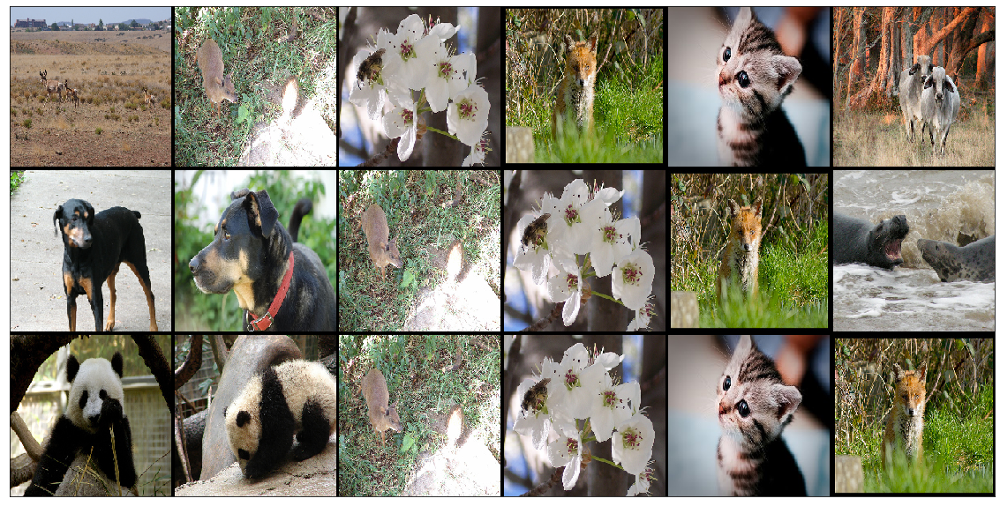

In [7]:
# image simialarity based on the feature space of the last layer  
import glob

target_images =["images/n02419796_11570_antelope.jpg", "images/doberman.png", "images/n02510455_7939_giant_panda.jpg"]
index_images = list(set(glob.glob("images/*")) - set(target_images))

visualization.viz_nearest_neighbors(target_images,
                                    index_images,
                                    vgg,
                                    "fc1",
                                    k=5,
                                    img_size=(224, 224, 3),
                                    f_preproc=preprocess_input,
                                    fig_size=(20,60))

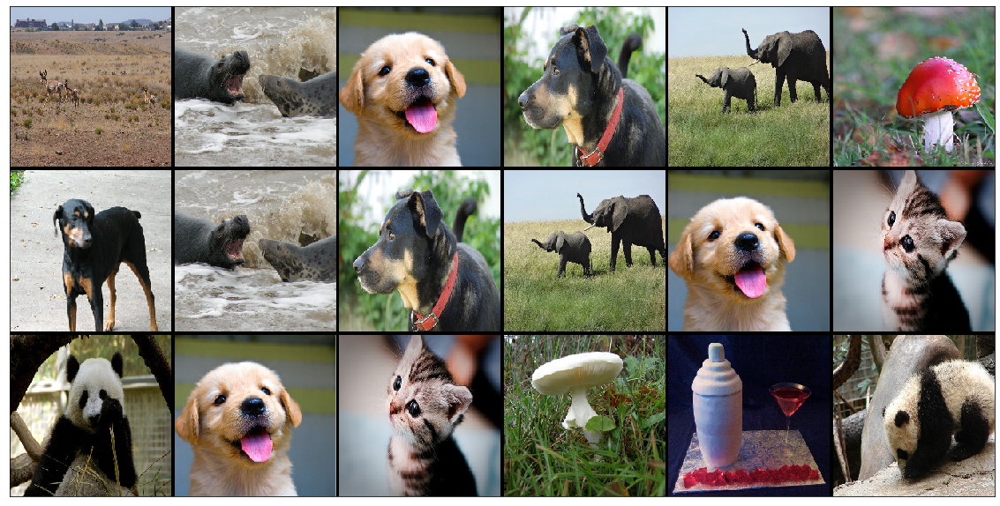

In [8]:
# image simialarity based on the original image feature space  

target_images =["images/n02419796_11570_antelope.jpg", "images/doberman.png", "images/n02510455_7939_giant_panda.jpg"]
index_images = list(set(glob.glob("images/*")) - set(target_images))
visualization.viz_nearest_neighbors(target_images,
                                    index_images,
                                    vgg,
                                    "block1_conv1",
                                    k=5,
                                    img_size=(224, 224, 3),
                                    f_preproc=preprocess_input,
                                    fig_size=(20,60))

<a id='maximize'></a>
## Maximal image generation

This technique generates the image that maximizes the activation of a neuron or a filter, and it was introduced in:

[Deep Inside Convolutional Networks: Visualising Image Classification Models and Saliency Maps](https://arxiv.org/abs/1312.6034) by K. Simonyan, A. Vedaldi, A. Zisserman. 


The underlying idea is that the generated image best describes the information and patterns that the neuron is able to capture. The image is generated by starting with a random image and then performing gradient ascent, where we maximize the value of the target neuron's activation by adjusting the values of the pixel of the image. The weights of the network are kept fixed during the process.

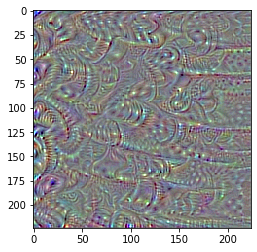

In [9]:
image = activation_maximization.image_filter_maximizer(vgg, "block5_conv2", 1, img_size=(224, 224, 3),
                                                       lrate=10, epochs=10)
image = utils.floats_to_pixels_standardized(image)
plt.imshow(image)
plt.show()

In alternative to the above code, the `visualization` module can be used to directly display images for multiple filters.
Here below we find the maximal images for the first 8 filters of the _block 5 conv 2_ layer.
We set `disc_dead = True` to discard images whose generating filter ends up having zero activation, since in this case the gradient cannot backpropagate and therefore the image does not react to gradient ascent.

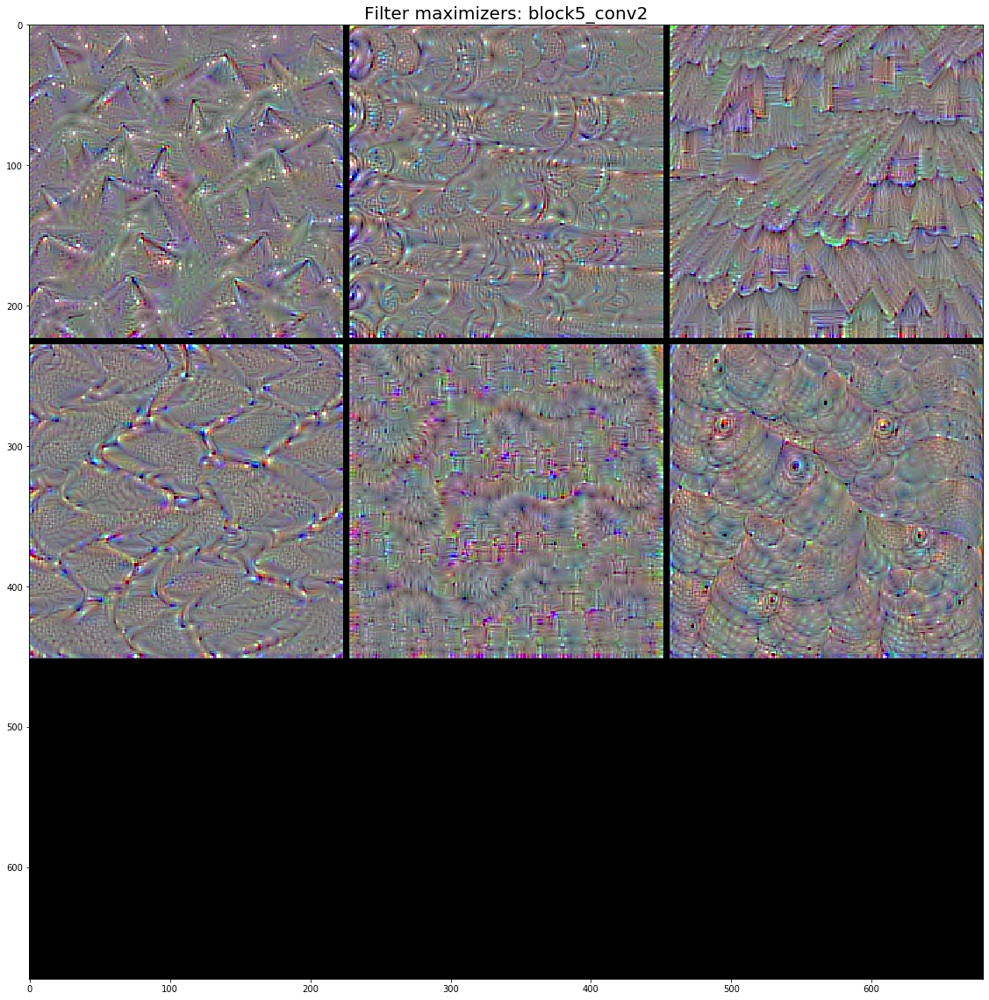

In [11]:
visualization.viz_layer_maximizers(vgg, "block5_conv2", img_size=(224, 224, 3), filters=[0,1,2,3,4,5,6,7,8],
                                   lrate=1, epochs=100, disc_dead=True)

This technique can also be applied to the neuron of the last layer that produces the class score. 
In such case the generated image represents the _prototypical image_ that the network has discovered for that class.
For example, here below we find the prototypical image for the Imagenet class _flamingo_ (class index in the last layer of VGG is 130).

Note that, as reported in Simonyan's paper, gradient ascent has to be applied to the unnormalizes class score, i.e. before sigmoid/softmax application, otherwise the visualization will not be optimal.
The `remove_activation=True` can be used to remove the activation function of the last layer, if needed.

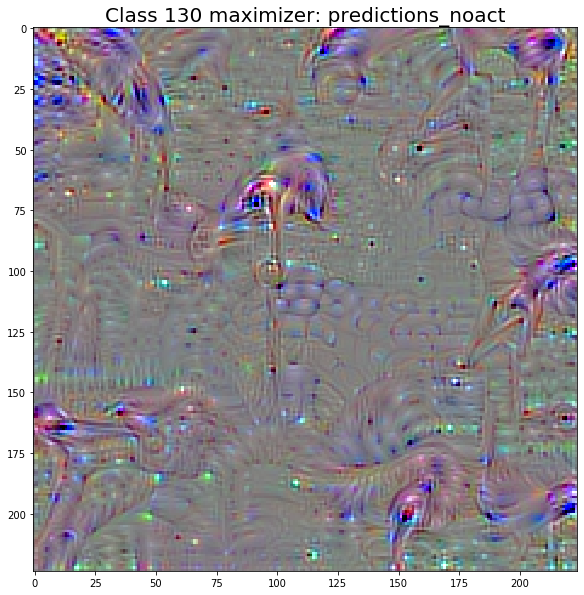

In [12]:
visualization.viz_class_score_maximizer(vgg, 130, img_size=(224, 224, 3), lrate=10, epochs=300, remove_activation=True)

<a id='saliency'></a>
## Saliency maps

Saliency maps aim at explaining which parts of an input image (i.e. which pixels) contribute the most to the classification produced by the neural network.



### Vanilla saliency maps

The first type of saliency maps, which we here call _vanilla saliency map_, are described in:
    
[Deep Inside Convolutional Networks: Visualising Image Classification Models and Saliency Maps](https://arxiv.org/abs/1312.6034) by K. Simonyan, A. Vedaldi, A. Zisserman. 

The vanilla saliency map computes the gradient of the predicted class score with respect to pixels of an input image.

More in detail, a vanilla saliency map has the same hight and width of the target image but only one channel, and each pixel in the map is the absolute value of the gradient of the class score, maxed across the RGB channels.

The intuition is that a high value of the gradient corresponds to those pixels that need to change the least to effect the class score the most, i.e. these are the pixels that matter the most for the classification of the class score.

Note that high values of the saliency map refer to pixels that are either positive of negative evidence for the target class.

Before applying a saliency map to an image, we first load and proprocess the image:

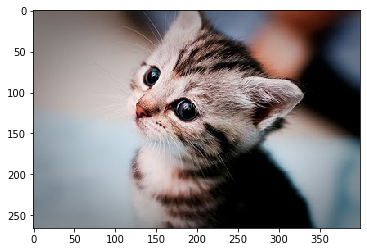

In [4]:
plt.imshow(image.imread("./images/kitten.jpg"))
plt.show()

In [5]:
x = utils.preproc_image("./images/kitten.jpg", img_size=(224, 224, 3), f_preproc=preprocess_input)

We then derive the saliency of the image calculate for class _tabby cat_ (index 281). If the `multiply` argument is `True` the saliency map is multiplied by the input image itself to obtain sharper edged. 

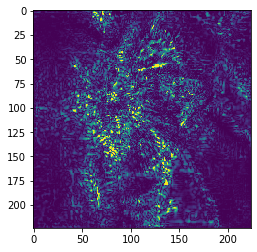

In [7]:
base_saliency = saliency.BaseSaliencyMap(vgg, multiply=True)
x = base_saliency.get_map(x, 281)
plt.imshow(x)
plt.show()

### Smooth grad saliency maps
Vanilla saliency maps tend to be visually noisy. The Smooth Grad paper [] postulates that the noise is due to meaningless local variations of the gradient around a given pixel value. Such local variations exist because of the inherent unsmoothness of the gradient in neural network.

In order to eliminate local variations, Smooth Grad computes multiple saliency maps. Each map is derived from a random local variation of the inuput image obtained by applying gaussian noise to each pixel. The final saliency map is obtained by averaging over all saliency maps.

Here below, `samples` is the number of saliency maps to average from, and `spread` controls the magnitude of the standard deviation of the gaussian noise with mean 0. 


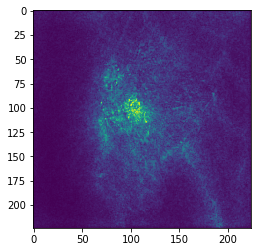

In [19]:
x = utils.preproc_image("./images/kitten.jpg", img_size=(224, 224, 3), f_preproc=preprocess_input)

smooth_saliency = saliency.SmoothGradMap(vgg, multiply=False)
x = smooth_saliency.get_map(x, 281, spread=0.2, samples=20)
plt.imshow(x)
plt.show()

### Integrated Gradient saliency maps
Similarly to smooth saliency, integrated gradients try to solve the issues of visual noise in saliency map.
The intuition of Integrated Gradients is that saliency is better measured in reference to a baseline image, e.g. a black image. Saliency should be high when the difference between the predictions for the target image and the baseline is high.
For example, two images of two different classes differ only in one pixel, then that pixel should have very high saliency, since it alone can differentiate between two different classes.

This intuition is captured by approximating the difference of the predictions of the two images by the line integral of the gradients of the target prediction function along the line that connects the two images in the multidimensional space of the pixels.

Here below, `samples` is the number of substeps used to approximate the integral. 

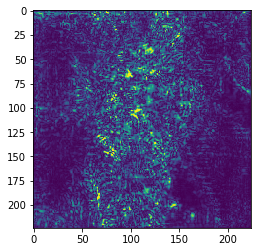

In [20]:
x = utils.preproc_image("./images/kitten.jpg", img_size=(224, 224, 3), f_preproc=preprocess_input)

ig_saliency = saliency.IntegratedGradientMap(vgg, multiply=False)
x = ig_saliency.get_map(x, 281, samples=20)
plt.imshow(x)
plt.show()

### Grad-Cam saliency maps

All of the above techniques work best for computing saliency for the original input image. Grad-Cam optimizes the computation of maps for any convolutional layer of the network.

First, it computes the gradient of the output class with respect to each neuron in the layer. Then, the gradients are pooled averaged for each of the _k_ filters. Then, the saliency map is computed as the average of the _k_ filters, each multiplied by the respective pooled gradients. 

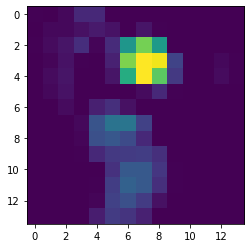

In [22]:
x = utils.preproc_image("./images/kitten.jpg", img_size=(224, 224, 3), f_preproc=preprocess_input)

gradcam_saliency = saliency.GradCamMap(vgg, layer_name="block5_conv3", multiply=False)
x = gradcam_saliency.get_map(x, 281)
plt.imshow(x)
plt.show()

## Visualization of saliency maps

The visualization module offers a simple way to display plots of different types of saliency maps.
Here below a few examples of calling the visualization module.

Visualize __vanilla saliency maps__:

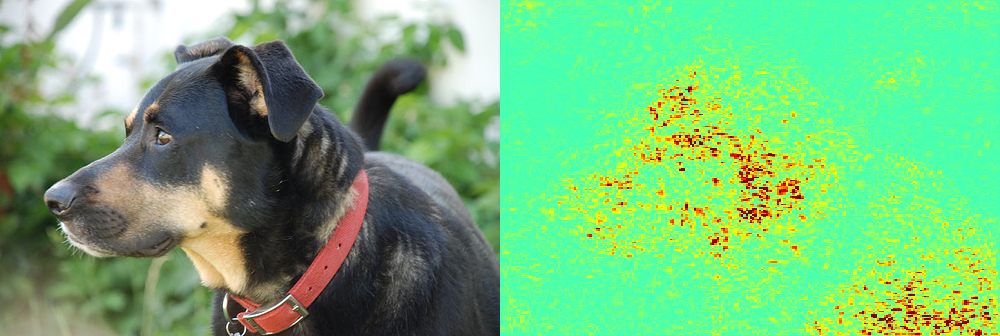

In [36]:
visualization.viz_saliency_map("./images/n02084071_77_dog.jpg", vgg, 281, img_size=(224, 224, 3),
                               f_preproc=preprocess_input, variant="vanilla", multiply=False, pair=True)

Overlap saliency map to the image using `blend=True`

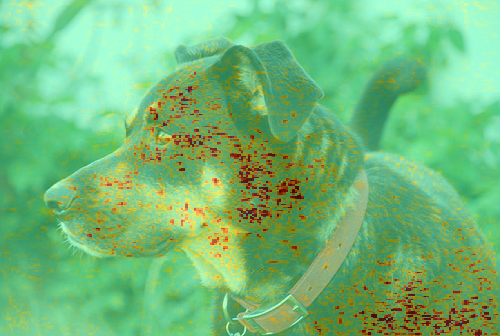

In [57]:
visualization.viz_saliency_map("./images/n02084071_77_dog.jpg", vgg, 281, img_size=(224, 224, 3), variant="vanilla",
                               f_preproc=preprocess_input, multiply=False, blend=True)

Vanilla saliency maps for a hidden convolutional layer:

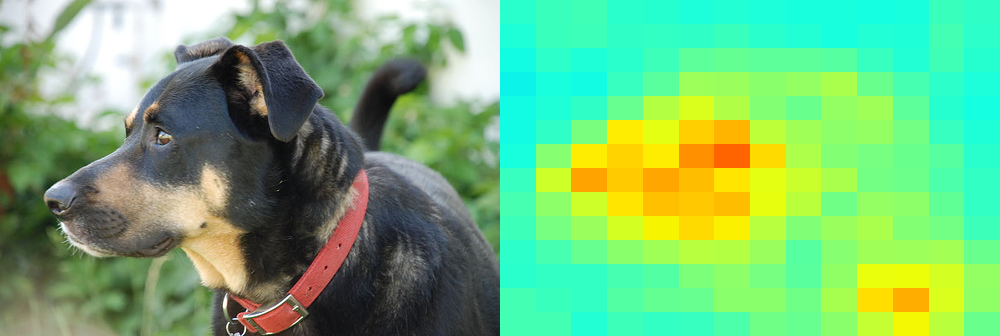

In [6]:
visualization.viz_saliency_map("./images/n02084071_77_dog.jpg", vgg, 281, img_size=(224, 224, 3), variant="vanilla",
                               f_preproc=preprocess_input, layer_name="block5_conv1", multiply=False, pair=True)

__Smoth Grad__ saliency maps:

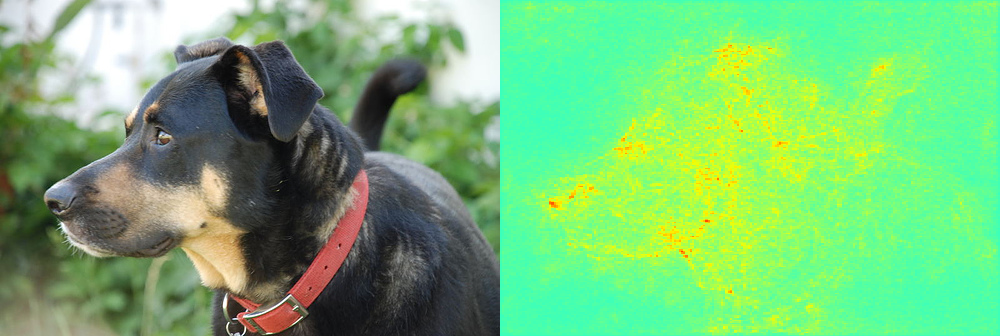

In [59]:
visualization.viz_saliency_map("./images/n02084071_77_dog.jpg", vgg, 281, img_size=(224, 224, 3), variant="smooth",
                               f_preproc=preprocess_input, multiply=False, pair=True, samples=15, spread=0.2)

__Integrated gradient__ saliency maps:

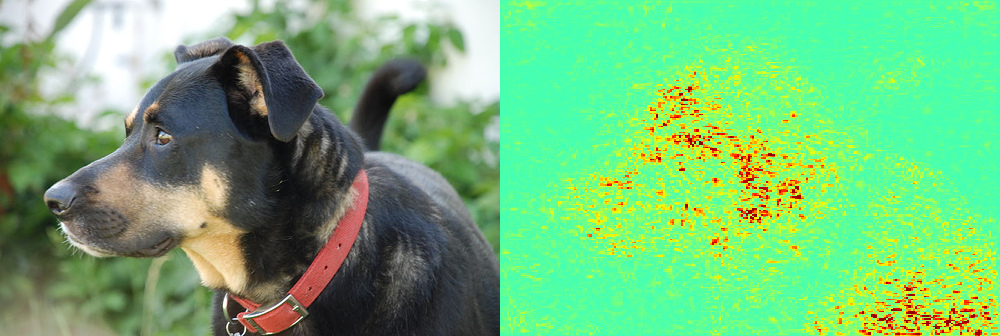

In [45]:
visualization.viz_saliency_map("./images/n02084071_77_dog.jpg", vgg, 281, img_size=(224, 224, 3), variant="integrated",
                               f_preproc=preprocess_input, multiply=False, pair=True, samples=50)

__Grad Cam__ saliency maps:

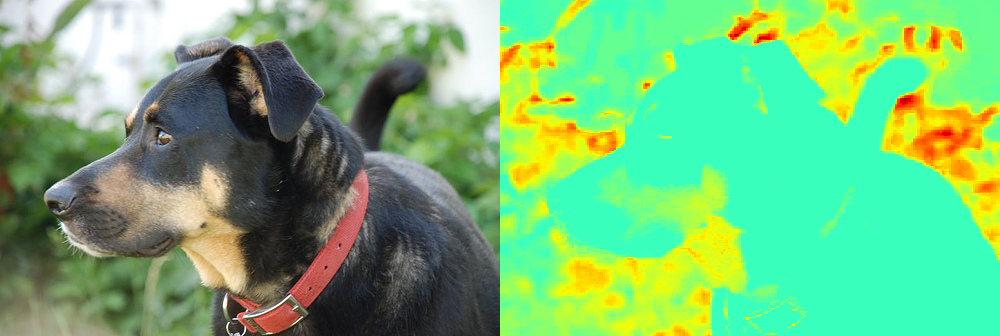

In [4]:
visualization.viz_saliency_map("./images/n02084071_77_dog.jpg", vgg, 281, img_size=(224, 224, 3), variant="gradcam",
                              f_preproc=preprocess_input, multiply=True, pair=True)

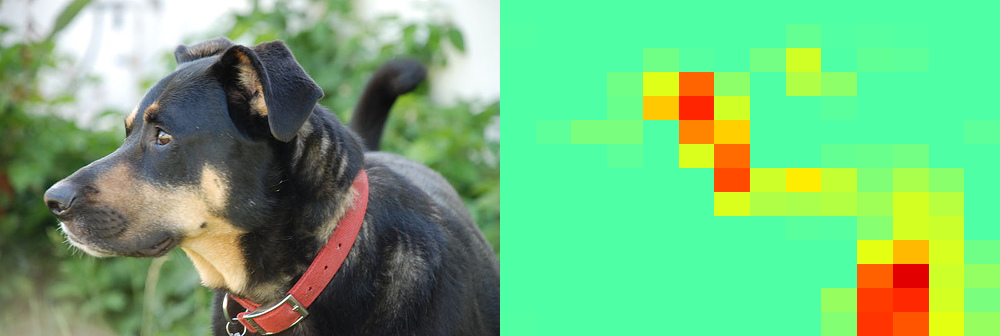

In [5]:
visualization.viz_saliency_map("./images/n02084071_77_dog.jpg", vgg, 281, img_size=(224, 224, 3),
                               f_preproc=preprocess_input, variant="gradcam",layer_name="block5_conv3",
                               multiply=True, pair=True)